<a href="https://colab.research.google.com/github/ChristianConchari/Ball-and-Beam-Static-Error-and-State-Observer-Control-/blob/master/tp_final_adia_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Carga de librerías y el dataset

In [386]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
from sklearn.impute import KNNImputer
from imblearn.over_sampling import SMOTE
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif, SelectFromModel
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split
from sklearn.svm import SVC

from mode import calculate_mode

In [188]:
data_df = pd.read_csv('data/data_playlist.csv')

# Visualización de las primeras filas



In [10]:
data_df.head()

,acousticness,danceability,duration,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,label
0,0.713,0.514,100125,0.521,0.816000,8,0.1120,-14.835,0,0.0444,119.879,4,0.143,1
1,0.192,0.714,207019,0.614,0.000000,4,0.2630,-6.935,1,0.0319,123.969,4,0.582,1
2,0.333,0.630,216200,0.455,0.000004,5,0.1270,-9.290,1,0.0292,139.931,4,0.199,1
3,0.601,0.810,136413,0.221,0.210000,5,0.1840,-11.005,1,0.0429,109.960,4,0.798,1
4,0.883,0.465,181440,0.459,0.000173,6,0.0692,-8.137,0,0.0351,90.807,4,0.288,1


# Resumen de 5 números

In [11]:
five_number_summary = data_df.describe().loc[['min', '25%', '50%', '75%', 'max']]

five_number_summary

,acousticness,danceability,duration,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,label
min,0.000001,0.10700,33840.00,0.00925,0.000000,0.0,0.02400,-29.60100,0.0,0.02340,55.74700,1.0,0.0332,0.0
25%,0.037150,0.48000,185490.25,0.42325,0.000000,1.0,0.09455,-10.17350,0.0,0.03590,98.99800,4.0,0.2970,0.0
50%,0.244500,0.60600,215108.50,0.63150,0.000010,5.0,0.12900,-7.27000,1.0,0.04875,120.10450,4.0,0.4830,1.0
75%,0.678500,0.71575,244236.75,0.80475,0.002245,8.0,0.26475,-5.09775,1.0,0.11300,138.07475,4.0,0.6845,1.0
max,0.994000,0.98600,675360.00,0.99500,0.967000,11.0,0.97900,-0.53300,1.0,0.72100,204.16200,5.0,0.9750,1.0


# Identificación de los tipos de datos

In [21]:
data_df.dtypes

acousticness        float64
danceability        float64
duration              int64
energy              float64
instrumentalness    float64
key                   int64
liveness            float64
loudness            float64
mode                  int64
speechiness         float64
tempo               float64
time_signature        int64
valence             float64
label                 int64
dtype: object

In [22]:
categorical_columns = list(data_df.select_dtypes(include=['object']).columns)
numerical_columns = list(data_df.select_dtypes(include=['float64', 'int64']).columns)

print(f'Categorical columns: {categorical_columns}')
print(f'Numerical columns: {numerical_columns}')

Categorical columns: []
Numerical columns: ['acousticness', 'danceability', 'duration', 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'speechiness', 'tempo', 'time_signature', 'valence', 'label']


| Variable           | Tipo               | Descripción                                                      |
|--------------------|--------------------|------------------------------------------------------------------|
| `acousticness`     | float64 (Continua) | Describe que tan acústica es una canción. Cuanto más cerca de 1.0, más probable es que sea acústica              |
| `danceability`     | float64 (Continua) | Describe que tan adecuada es una pista para bailar, basada en una combinación de elementos musicales incluyendo tempo, estabilidad del ritmo, entre otros                   |
| `duration`         | int64 (Continua)   | Duración de la pista en milisegundos                              |
| `energy`           | float64 (Continua) | Representa una medida perceptual de intensidad y actividad. Por ejemplo, las pistas enérgicas pueden sentirse rápidas, fuertes y ruidosas                        |
| `instrumentalness` | float64 (Continua) | Representa la cantidad de voces en la canción. Cuanto más instrumental sea la canción, más cerca estará de 1.0                        |
| `key`              | int64 (Categórica Ordinal) | Clave musical de la pista. Utiliza enteros para mapear a tonos específicos usando la notación estándar de Clase de Tono.                                         |
| `liveness`         | float64 (Continua) | Describe la probabilidad de que la canción haya sido grabada con una audiencia en vivo                          |
| `loudness`         | float64 (Continua) | Volumen general de la pista en dB                    |
| `mode`             | int64 (Categórica Binaria) | El modo indica la modalidad (mayor o menor) de una pista, el tipo de escala de la cual se deriva su contenido melódico. El modo mayor está representado por 1 y el menor por 0                               |
| `speechiness`      | float64 (Continua) | Detecta la presencia de palabras habladas en la pista                            |
| `tempo`            | float64 (Continua) | Tempo de la pista en pulsaciones por minuto (BPM)                     |
| `time_signature`   | int64 (Categórica Ordinal) | El compás es una convención notacional para especificar cuántos tiempos hay en cada compás (o medida)                      |
| `valence`          | float64 (Continua) | Una medida de 0.0 a 1.0 que describe la positividad musical transmitida por una pista. Las pistas con alta valencia suenan más positivas                  |
| `label`            | int64 (Categórica Nominal) | Etiqueta o categoría de la pista. Si la canción le gusta al usuario, se etiqueta como 1, de lo contrario, se etiqueta como 0.                     |


Todas las variables enumeradas son informativas para un problema de clasificación. Es importante tener en cuenta que, aunque algunas como `key`, `mode` y `time_signature` son categóricas (binarias y ordinales), se representan como valores numéricos.

In [36]:
categorical_columns = ['key', 'mode', 'time_signature', 'label']
numerical_columns = [ x for x in numerical_columns if x not in categorical_columns ]

print(f'Categorical columns: {categorical_columns}')
print(f'Numerical columns: {numerical_columns}')

Categorical columns: ['key', 'mode', 'time_signature', 'label']
Numerical columns: ['acousticness', 'danceability', 'duration', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence']


# Análisis de variables de entrada

## Numéricas continuas

In [23]:
numerical_columns_without_label = [col for col in numerical_columns if col != 'label']

summary_stats = data_df[numerical_columns_without_label].describe().T
summary_stats['median'] = data_df[numerical_columns_without_label].median()
summary_stats['variance'] = data_df[numerical_columns_without_label].var()

summary_stats = summary_stats.drop(columns=['min', '25%', '50%', '75%', 'max'])

summary_stats = summary_stats[['mean', 'median', 'std', 'variance']]

summary_stats

,mean,median,std,variance
acousticness,0.357394,0.24450,0.338405,1.145181e-01
danceability,0.596439,0.60600,0.172036,2.959653e-02
duration,220112.733333,215108.50000,65587.690483,4.301745e+09
energy,0.594188,0.63150,0.253301,6.416155e-02
instrumentalness,0.100245,0.00001,0.259921,6.755916e-02
key,4.829333,5.00000,3.636001,1.322050e+01
liveness,0.203376,0.12900,0.177609,3.154482e-02
loudness,-8.509339,-7.27000,5.039488,2.539644e+01
mode,0.741333,1.00000,0.438194,1.920142e-01
speechiness,0.098966,0.04875,0.104715,1.096513e-02


### Análisis de distribución

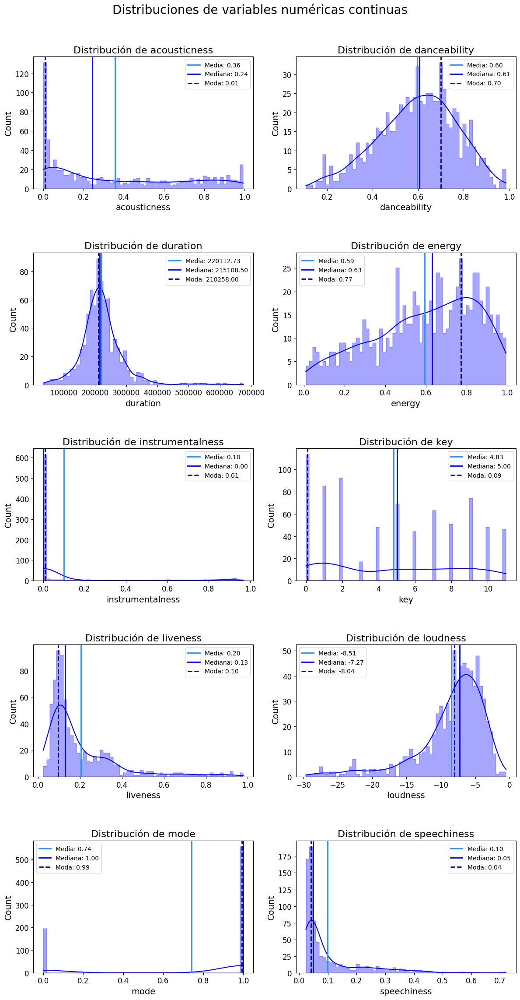

In [26]:
fig, axes = plt.subplots(5, 2, figsize=(12, 24))
fig.suptitle('Distribuciones de variables numéricas continuas', fontsize=20)

for ax, var in zip(axes.flatten(), numerical_columns):
    sns.histplot(data=data_df, x=var, kde=True, ax=ax, color='blue', element='step', bins=60, alpha=0.35, edgecolor='blue', linewidth=0.3)

    mean = data_df[var].mean()
    median = data_df[var].median()
    mode = calculate_mode(data_df[var])

    ax.axvline(mean, color='dodgerblue', linestyle='-', label=f'Media: {mean:.2f}', linewidth=2)
    ax.axvline(median, color='blue', linestyle='-', label=f'Mediana: {median:.2f}', linewidth=2)
    ax.axvline(mode, color='darkblue', linestyle='--', label=f'Moda: {mode:.2f}', linewidth=2)

    ax.set_title(f'Distribución de {var}', fontsize=16)
    ax.set_xlabel(var, fontsize=14)
    ax.set_ylabel('Count', fontsize=14)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.legend(fontsize=10)

plt.tight_layout(rect=[0, 0.03, 1, 0.65])
plt.subplots_adjust(top=0.93)
plt.show()

### Conclusiones sobre las distribuciones

| Variable         | Promedio      | Moda          | Perspectivas de la Lista de Reproducción                                                                 |
|------------------|---------------|---------------|-----------------------------------------------------------------------------------------------|
| Acousticness     | 0.36          | 0.01          | La mayoría de las pistas tienen baja acústica, lo que indica música fuertemente producida.     |
| Danceability     | 0.60          | 0.70          | Las pistas tienen buena bailabilidad, adecuada para un ambiente enérgico.                      |
| Duration         | 220112.73 ms  | 210258.00 ms  | Las pistas suelen durar entre 3 y 4 minutos, adecuadas para la escucha mainstream.             |
| Energy           | 0.59          | 0.77          | Pistas de energía relativamente alta, adecuadas para entrenamientos o fiestas.                               |
| Instrumentalness | 0.10          | 0.01          | Principalmente pistas vocales, con muy pocas piezas instrumentales.                            |
| Liveness         | 0.20          | 0.10          | Predominantemente grabaciones de estudio con poco ruido de audiencia.                          |
| Loudness         | -8.51 dB      | -8.04 dB      | Las pistas están masterizadas a niveles de volumen estándar para la música moderna.            |
| Speechiness      | 0.10          | 0.04          | Predominantemente presenta letras cantadas en lugar de palabras habladas o rap.                |
| Tempo            | 120.41 BPM    | 128.72 BPM    | Tempos variados con una tendencia central alrededor de 120 BPM, típico de pistas bailables.    |
| Valence          | 0.50          | 0.53          | Mezcla equilibrada de pistas felices y tristes, proporcionando tonos emocionales variados.     |


### Relación de las variables numéricas con la variable de salida

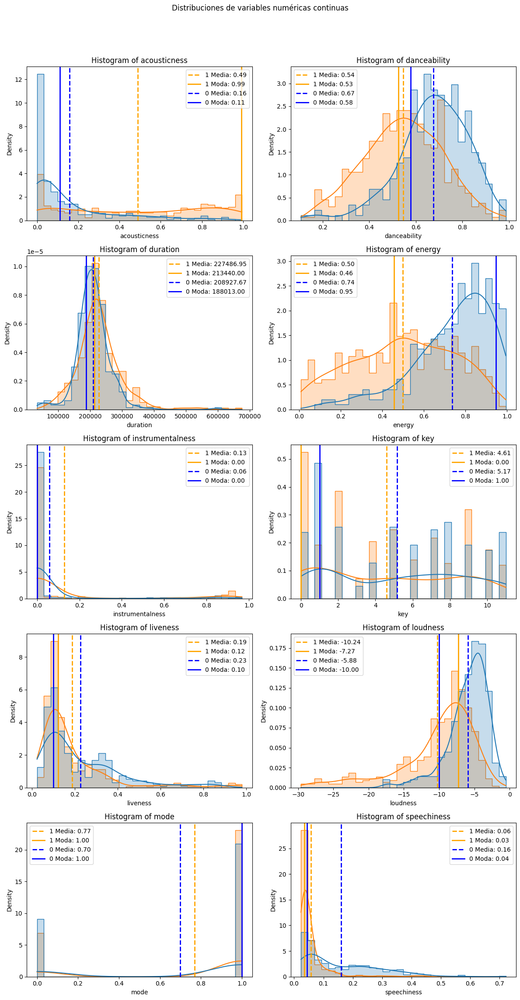

In [28]:
colors = { 0: 'blue', 1: 'orange' }

fig, axes = plt.subplots(5, 2, figsize=(12, 24))
fig.suptitle('Distribuciones de variables numéricas continuas')

for ax, var in zip(axes.flatten(), numerical_columns):
    sns.histplot(data=data_df, x=var, hue='label', kde=True, ax=ax, bins=30, element='step', stat="density", common_norm=False)

    for label in data_df['label'].unique():
        subset = data_df[data_df['label'] == label]
        mean = subset[var].mean()
        mode = subset[var].mode().values[0]

        color = colors[label]

        ax.axvline(mean, color=color, linestyle='--', label=f'{label} Media: {mean:.2f}', linewidth=2)
        ax.axvline(mode, color=color, linestyle='-', label=f'{label} Moda: {mode:.2f}', linewidth=2)

    ax.set_title(f'Histogram of {var}')
    ax.legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Conclusiones sobre la relación de las variables numéricas con la variable de salida

| Variable         | Canciones Gustadas (Label=1)             | Canciones No Gustadas (Label=0)       | Perspectiva                                                                                   |
|------------------|------------------------------------------|---------------------------------------|-----------------------------------------------------------------------------------------------|
| Acousticness     | Promedio: 0.49, Moda: 0.99               | Promedio: 0.16, Moda: 0.11            | Las canciones gustadas tienden a tener mayor acústica, indicando una preferencia por pistas más acústicas.  |
| Danceability     | Promedio: 0.54, Moda: 0.53               | Promedio: 0.67, Moda: 0.58            | Las canciones no gustadas tienden a ser más bailables.                                                     |
| Duration         | Promedio: 227486.95 ms, Moda: 231440.00 ms| Promedio: 208927.67 ms, Moda: 188013.00 ms| Las canciones gustadas tienden a ser ligeramente más largas, alrededor de 3.8 minutos.                       |
| Energy           | Promedio: 0.50, Moda: 0.46               | Promedio: 0.74, Moda: 0.95            | Las canciones no gustadas tienden a tener más energía.                                                     |
| Instrumentalness | Promedio: 0.13, Moda: 0.00               | Promedio: 0.06, Moda: 0.00            | Las canciones gustadas tienden a ser ligeramente más instrumentales pero generalmente tienen valores bajos.  |
| Liveness         | Promedio: 0.19, Moda: 0.12               | Promedio: 0.23, Moda: 0.10            | Las canciones no gustadas tienden a tener mayor viveza, indicando una preferencia por grabaciones de estudio.|
| Loudness         | Promedio: -10.24 dB, Moda: -7.27 dB      | Promedio: -5.88 dB, Moda: -10.00 dB   | Las canciones no gustadas tienden a ser más ruidosas.                                                      |
| Speechiness      | Promedio: 0.06, Moda: 0.03               | Promedio: 0.16, Moda: 0.04            | Las canciones no gustadas tienden a tener mayor presencia de palabras habladas, indicando una preferencia por menos palabras habladas. |
| Tempo            | Promedio: 118.76 BPM, Moda: 89.02 BPM    | Promedio: 122.91 BPM, Moda: 86.04 BPM | Las canciones no gustadas tienden a tener un tempo más alto.                                                |
| Valence          | Promedio: 0.46, Moda: 0.20               | Promedio: 0.55, Moda: 0.12            | Las canciones no gustadas tienden a tener mayor valencia, indicando una preferencia por tonos emocionales variados. |


## Categoricas

### Análisis de distribución

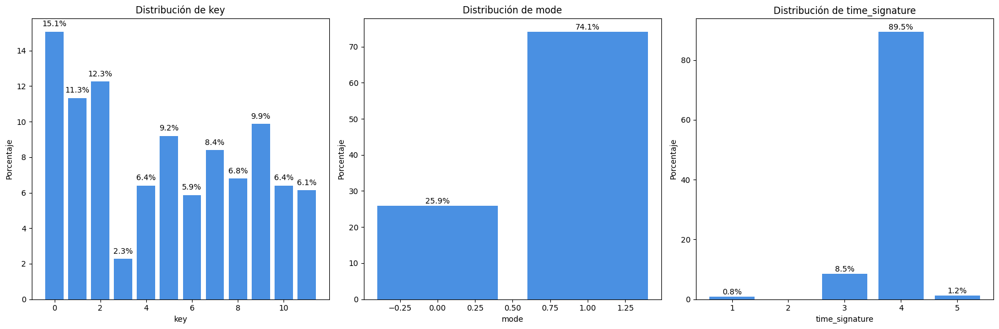

In [47]:
bins_color = '#4A90E2'

categorical_columns_without_label = [col for col in categorical_columns if col != 'label']
titles = ['Distribución de key', 'Distribución de mode', 'Distribución de time_signature']

fig, axs = plt.subplots(1, 3, figsize=(18, 6))

for ax, column, title in zip(axs, categorical_columns_without_label, titles):
    counts = data_df[column].value_counts(normalize=True) * 100
    bars = ax.bar(counts.index, counts.values, color=bins_color)
    ax.set_ylabel('Porcentaje')
    ax.set_xlabel(column)
    ax.set_title(title)
    for bar in bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, yval + 0.2, f'{yval:.1f}%', ha='center', va='bottom')

plt.tight_layout()
plt.show()

### Conclusiones sobre la cardinalidad

| Variable         | Mediana       | Promedio          | Cardinalidad | Perspectivas de la Lista de Reproducción                                                                   |
|------------------|---------------|--------------------|-------------|-------------------------------------------------------------------------------------------------------------|
| **Key**          | 5             | 5.19               | 12          | La clave más común es '0' (C mayor/A menor), lo que indica una preferencia por estas claves versátiles en la música popular.|
| **Mode**         | 1             | 0.74               | 2           | Predominantemente en modo mayor, reflejando un estado de ánimo optimista y positivo. Las pistas en modo menor añaden algo de variedad.|
| **Time Signature**| 4             | 3.80               | 4           | Mayormente en compás de 4/4, estándar en la música popular, con algunas variaciones para diversidad rítmica.|

### Relación de variables categóricas con la variable objetivo

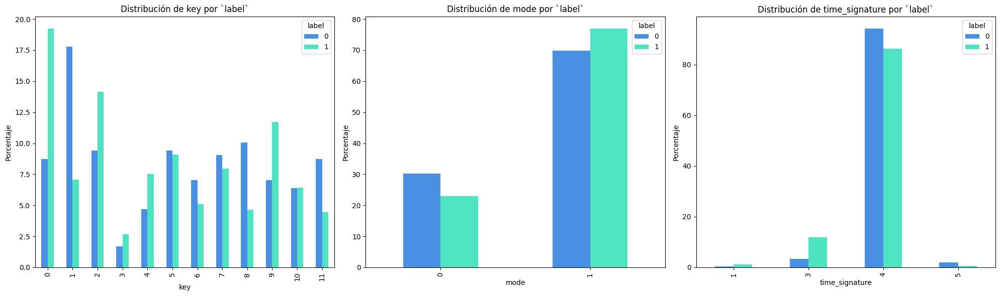

In [52]:
fig, axs = plt.subplots(1, 3, figsize=(20, 6))

columns = ['key', 'mode', 'time_signature']

for ax, column in zip(axs, columns):
    crosstab = pd.crosstab(data_df[column], data_df['label'], normalize='columns') * 100
    crosstab.plot(kind='bar', ax=ax, color=['#4A90E2', '#50E3C2'])
    ax.set_title(f'Distribución de {column} por `label`')
    ax.set_xlabel(column)
    ax.set_ylabel('Porcentaje')
    ax.legend(title='label', loc='upper right')

plt.tight_layout()
plt.show()

| Variable         | Perspectivas de la Lista de Reproducción                                                                     |
|------------------|-------------------------------------------------------------------------------------------------------------|
| **Key**          | Ambas etiquetas muestran una preferencia por la clave '0' (C mayor/A menor), pero la distribución de claves varía entre las etiquetas, lo que indica diversidad en las preferencias de clave según la etiqueta. |
| **Mode**         | El modo mayor (1) es predominante en ambas etiquetas, con una proporción ligeramente mayor de gusto por las canciones optimistas. |
| **Time Signature**| El compás de 4/4 es dominante en ambas etiquetas, estándar en la música popular, con variaciones menores en otros compases entre las etiquetas. |


## Compuestas

En el conjunto de datos base, no existen características compuestas. Sin embargo, es posible crear nuevas características combinando las existentes. Por ejemplo, podemos crear una nueva característica llamada `loudness_energy` multiplicando las características `loudness` y `energy`.

Esta nueva característica podría ayudar al modelo a capturar las interacciones entre la sonoridad y la energía en las pistas, potencialmente mejorando su rendimiento predictivo. Sin embargo, para crear características compuestas efectivas, es necesario realizar un análisis adicional para entender las correlaciones entre las características existentes. Identificar correlaciones fuertes puede ayudar en el diseño de nuevas características que capturen interacciones significativas y contribuyan a la precisión del modelo.

# Análisis de variables de salida

## Balance de clases

(0.0, 502.0)

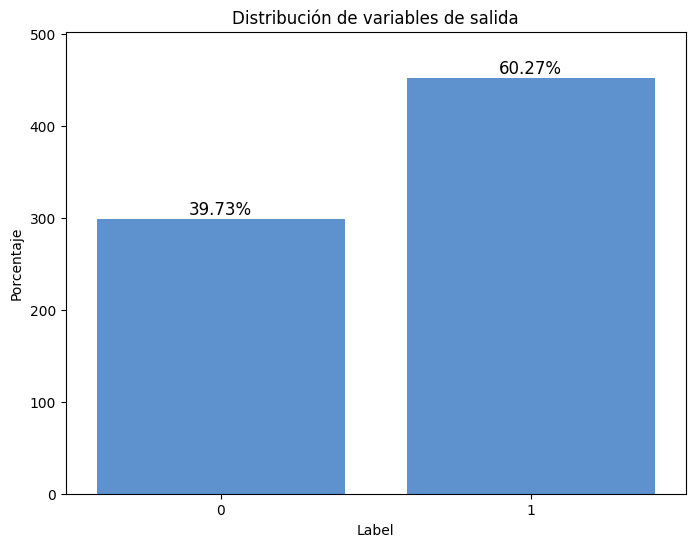

In [55]:
label_counts = data_df['label'].value_counts()
label_percentages = (label_counts / label_counts.sum()) * 100

plt.figure(figsize=(8, 6))

ax = sns.countplot(data=data_df, x='label', color='#4A90E2')

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height + 5, '{:.2f}%'.format(height / len(data_df) * 100), ha='center', fontsize=12, color='black')

plt.title('Distribución de variables de salida')
plt.xlabel('Label')
plt.ylabel('Porcentaje')
plt.ylim(0, label_counts.max() + 50)

En la imagen superior, podemos ver que el conjunto de datos está desequilibrado, con una clase que representa aproximadamente el 60% de los datos. Este desequilibrio puede afectar al rendimiento del modelo, especialmente en el caso de algoritmos sensibles a la distribución de clases.

## Codificación de la variable de salida

La variable objetivo `label` es una variable categórica con dos clases: `0` y `1`. Podemos decir que ya está codificada con el siguiente mapeo:

- `0`: Canciones que no me gustan
- `1`: Canciones que me gustan

# Análisis de datos faltantes

In [57]:
missing_values = data_df.isnull().sum()

observations = data_df.shape[0]

missing_data_summary = pd.DataFrame({
    'Variable': missing_values.index,
    'Valores faltantes': missing_values.values,
    'Observaciones totales': observations,
    'Porcentaje de valores faltantes': (missing_values.values / observations) * 100
})

missing_data_summary

,Variable,Valores faltantes,Observaciones totales,Porcentaje de valores faltantes
0,acousticness,0,750,0.0
1,danceability,0,750,0.0
2,duration,0,750,0.0
3,energy,0,750,0.0
4,instrumentalness,0,750,0.0
5,key,0,750,0.0
6,liveness,0,750,0.0
7,loudness,0,750,0.0
8,mode,0,750,0.0
9,speechiness,0,750,0.0


## Imputación de datos faltantes

Como puede verse en la tabla anterior, no faltan valores en el conjunto de datos actual. Por lo tanto, no se necesitan métodos de imputación. Sin embargo, si fuera necesario, podrían emplearse técnicas como la media, la moda o algoritmos como KNN para imputar los valores faltantes.

Para este dataset, utilizaría la media o KNN para las variables continuas, y la moda o la frecuencia relativa para las variables categóricas.

In [377]:
demo_data_df = data_df.copy()

np.random.seed(42)

missing_percentage = 0.1

missing_indices_continuous = np.random.choice(demo_data_df.index, size=int(missing_percentage * len(demo_data_df)), replace=False)
missing_indices_categorical = np.random.choice(demo_data_df.index, size=int(missing_percentage * len(demo_data_df)), replace=False)

demo_data_df.loc[missing_indices_continuous, 'acousticness'] = np.nan
demo_data_df.loc[missing_indices_continuous, 'danceability'] = np.nan

demo_data_df.loc[missing_indices_categorical, 'key'] = np.nan
demo_data_df.loc[missing_indices_categorical, 'mode'] = np.nan

print('Valores faltantes artificiales')
demo_data_df.isnull().sum()

Valores faltantes artificiales


acousticness        75
danceability        75
duration             0
energy               0
instrumentalness     0
key                 75
liveness             0
loudness             0
mode                75
speechiness          0
tempo                0
time_signature       0
valence              0
label                0
dtype: int64

In [378]:
demo_data_df[demo_data_df.isna().any(axis=1)].sample(10)

,acousticness,danceability,duration,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,label
520,0.0325,0.746,179974,0.779,0.000006,NaN,0.3010,-3.928,NaN,0.2680,99.906,4,0.535,0
218,NaN,NaN,194490,0.896,0.824000,10.0,0.3270,-3.700,0.0,0.0655,102.043,4,0.559,0
453,NaN,NaN,267867,0.925,0.000002,NaN,0.9050,-6.446,NaN,0.2200,112.092,4,0.626,1
497,NaN,NaN,195053,0.714,0.000000,5.0,0.1720,-3.107,1.0,0.0273,122.058,4,0.825,0
538,NaN,NaN,292093,0.907,0.000000,0.0,0.8250,-4.757,0.0,0.1300,154.000,4,0.553,0
584,0.0884,0.632,347707,0.437,0.000623,NaN,0.0623,-15.560,NaN,0.0315,131.188,4,0.756,1
707,NaN,NaN,66481,0.199,0.000000,0.0,0.1330,-10.563,1.0,0.0634,113.000,4,0.290,1
740,NaN,NaN,216450,0.577,0.000000,NaN,0.2340,-7.549,NaN,0.1570,100.034,4,0.451,0
57,0.6820,0.427,297933,0.377,0.000000,NaN,0.1050,-8.136,NaN,0.0334,125.081,4,0.245,1
257,0.0717,0.609,199827,0.737,0.000000,NaN,0.0575,-5.588,NaN,0.4220,130.106,4,0.286,0


### Utilizando KNN para variables numéricas continuas

In [379]:
imputer_continuous = KNNImputer(n_neighbors=5)
demo_data_df[['acousticness', 'danceability']] = imputer_continuous.fit_transform(demo_data_df[['acousticness', 'danceability']])

indices_interes = [520, 218, 453, 497, 538, 584, 707, 740, 57, 257]

### Utilizando Frecuencias para variables categóricas

In [384]:
frequencies_key = demo_data_df['key'].value_counts(normalize=True)
frequencies_mode = demo_data_df['mode'].value_counts(normalize=True)

missing_values_count_key = demo_data_df['key'].isna().sum()
missing_values_count_mode = demo_data_df['mode'].isna().sum()

if missing_values_count_key > 0:
    imputed_values_key = np.random.choice(frequencies_key.index, size=missing_values_count_key, p=frequencies_key.values)
    demo_data_df.loc[demo_data_df['key'].isna(), 'key'] = imputed_values_key.astype(int)

if missing_values_count_mode > 0:
    imputed_values_mode = np.random.choice(frequencies_mode.index, size=missing_values_count_mode, p=frequencies_mode.values)
    demo_data_df.loc[demo_data_df['mode'].isna(), 'mode'] = imputed_values_mode.astype(int)

demo_data_df['key'] = demo_data_df['key'].astype(int)
demo_data_df['mode'] = demo_data_df['mode'].astype(int)

### Comparación con los datos originales

In [385]:
original_data = data_df.loc[indices_interes, ['acousticness', 'danceability', 'key', 'mode']]

imputed_data = demo_data_df.loc[indices_interes, ['acousticness', 'danceability', 'key', 'mode']]

comparison = pd.DataFrame({
    'Original Acousticness': original_data['acousticness'],
    'Imputed Acousticness': imputed_data['acousticness'],
    'Original Danceability': original_data['danceability'],
    'Imputed Danceability': imputed_data['danceability'],
    'Original Key': original_data['key'],
    'Imputed Key': imputed_data['key'],
    'Original Mode': original_data['mode'],
    'Imputed Mode': imputed_data['mode']
})

comparison

,Original Acousticness,Imputed Acousticness,Original Danceability,Imputed Danceability,Original Key,Imputed Key,Original Mode,Imputed Mode
520,0.032500,0.032500,0.746,0.746000,6,2,0,1
218,0.000459,0.358093,0.598,0.596401,10,10,0,0
453,0.275000,0.358093,0.531,0.596401,9,6,1,1
497,0.401000,0.358093,0.602,0.596401,5,5,1,1
538,0.019300,0.358093,0.539,0.596401,0,0,0,0
584,0.088400,0.088400,0.632,0.632000,2,1,1,1
707,0.288000,0.358093,0.693,0.596401,0,0,1,1
740,0.202000,0.358093,0.755,0.596401,3,6,1,1
57,0.682000,0.682000,0.427,0.427000,5,10,1,1
257,0.071700,0.071700,0.609,0.609000,1,6,1,1


# Análisis de relaciones entre variables de entrada

## Matriz de correlación

In [113]:
correlation_matrix = data_df.corr()

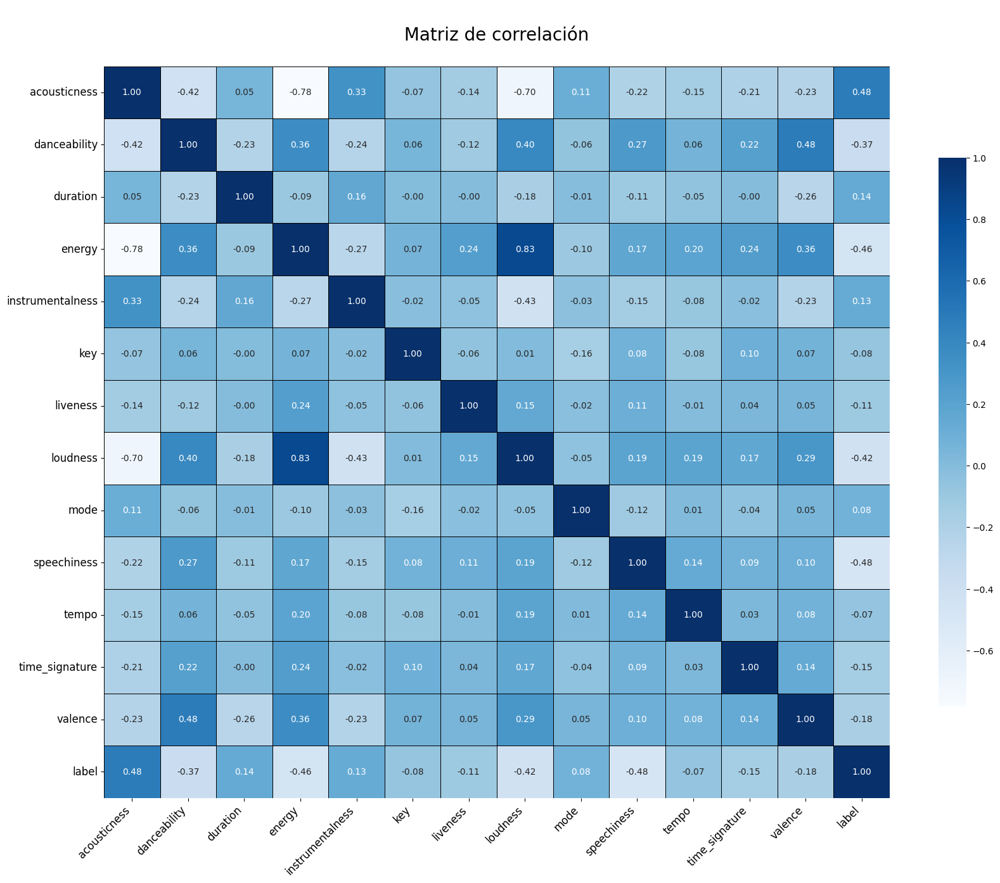

In [114]:
plt.figure(figsize=(20,15))
sns.heatmap(correlation_matrix, annot=True, cmap = sns.color_palette("Blues", as_cmap=True), fmt='.2f', linewidths=0.5, linecolor='black', cbar_kws={"shrink": 0.75})
plt.title('\n Matriz de correlación \n', fontsize=20)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12, rotation=0)
plt.show()

### Variables con alta correlación entre sí

In [116]:
high_corr_threshold = 0.7

high_corr_pairs = [(correlation_matrix.columns[i], correlation_matrix.columns[j], correlation_matrix.iloc[i, j])
                   for i in range(len(correlation_matrix.columns))
                   for j in range(i+1, len(correlation_matrix.columns))
                   if abs(correlation_matrix.iloc[i, j]) > high_corr_threshold]

high_corr_df = pd.DataFrame(high_corr_pairs, columns=['Feature 1', 'Feature 2', 'Correlation'])

print("Pares de variables con correlación mayor de 0.7:")
high_corr_df

Pares de variables con correlación mayor de 0.7:


,Feature 1,Feature 2,Correlation
0,acousticness,energy,-0.781691
1,energy,loudness,0.830081


Para explorar más a fondo estas variables altamente correlacionadas entre sí, podemos trazar un gráfico de dispersión del par de variables.

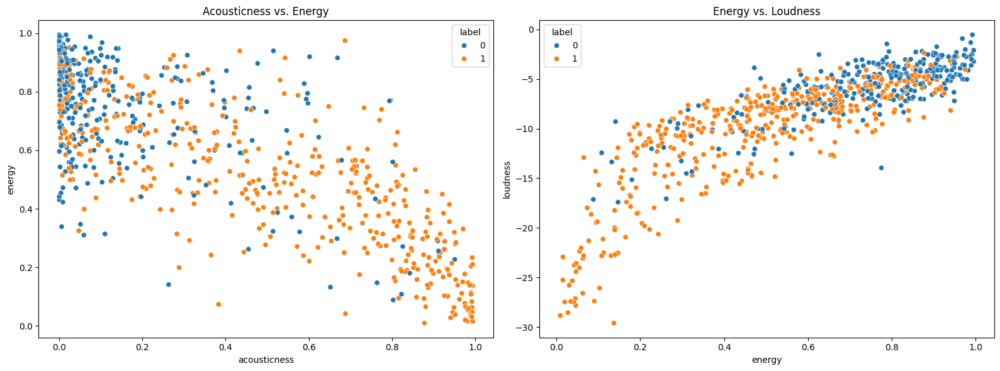

In [117]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(data=data_df, x='acousticness', y='energy', hue='label', ax=axes[0])
axes[0].set_title('Acousticness vs. Energy')

sns.scatterplot(data=data_df, x='energy', y='loudness', hue='label', ax=axes[1])
axes[1].set_title('Energy vs. Loudness')

plt.tight_layout()
plt.show()

Los gráficos de dispersión revelan que la acústica y la energía tienen una correlación negativa, lo que indica que las vías con un alto nivel de acústica suelen tener un bajo nivel de energía, lo que concuerda con la naturaleza más tranquila de las vías acústicas.

Por el contrario, la energía y la sonoridad muestran una fuerte correlación positiva, lo que subraya su estrecha relación, ya que las pistas más ruidosas tienden a ser más energéticas.

Estos patrones sugieren posibles problemas de multicolinealidad entre la energía y la sonoridad, y entre la acústica y la energía, que podrían afectar al rendimiento del modelo si no se abordan.

## Gráficos de dispersión

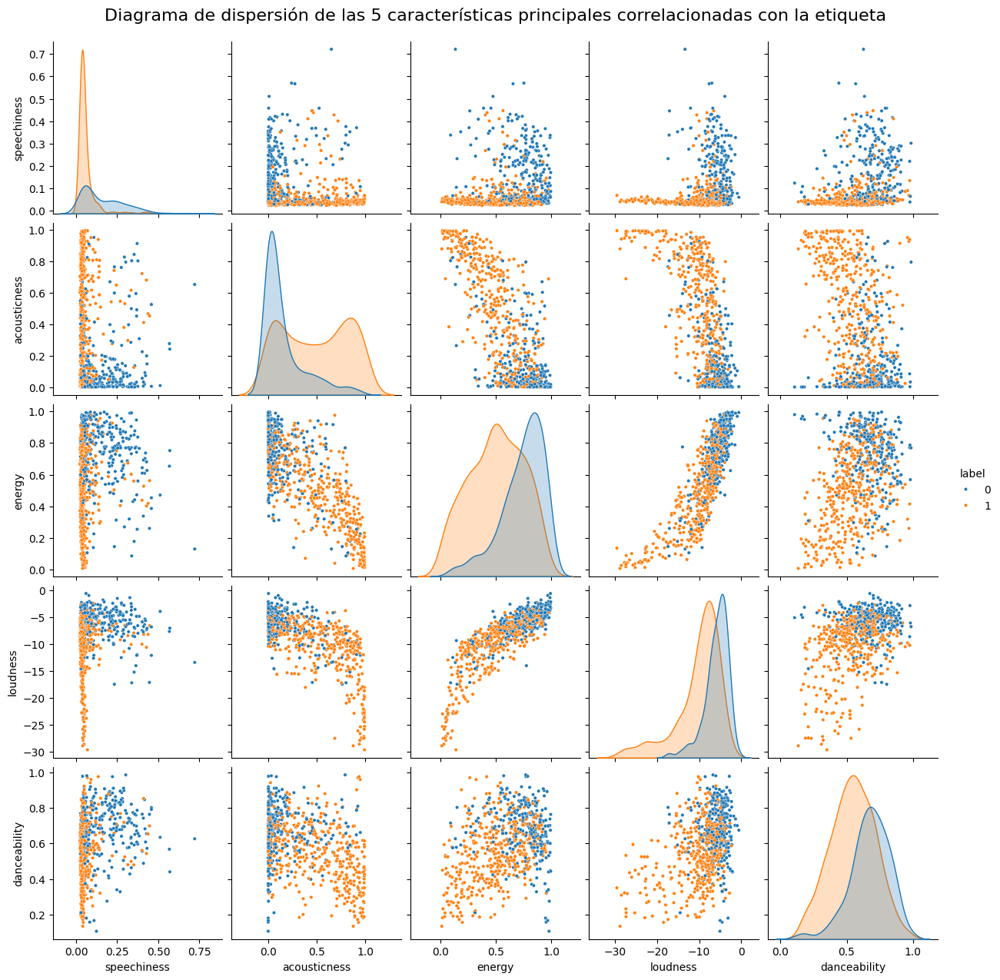

In [121]:
correlations = correlation_matrix['label'].drop('label')
sorted_correlations = correlations.reindex(correlations.abs().sort_values(ascending=False).index)

point_size = 10

top_features = list(sorted_correlations.head(5).index) + ['label']
sns.pairplot(data_df[top_features], hue='label', plot_kws={'s': point_size}, diag_kind='kde')
plt.suptitle('Diagrama de dispersión de las 5 características principales correlacionadas con la etiqueta', fontsize=16, y=1.02)
plt.show()

# Identificación de variables de entrada de mayor importancia

## Mediante Información mutua

In [129]:
X = data_df.drop('label', axis=1)
y = data_df['label']

mutual_info = mutual_info_classif(X, y)
mutual_info_series = pd.Series(mutual_info, index=X.columns).sort_values(ascending=False)

df_mutual_info = pd.DataFrame(mutual_info_series, columns=['Mutual Information'])
df_mutual_info.head(5)

,Mutual Information
speechiness,0.160839
loudness,0.145730
energy,0.134080
acousticness,0.126842
danceability,0.104526


## Mediante selección del modelo

In [130]:
X = data_df.drop('label', axis=1)
y = data_df['label']

# Train a Random Forest model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

# Use SelectFromModel to select the most important features
selector = SelectFromModel(rf, threshold='mean', prefit=True)
X_selected = selector.transform(X)

# Get the selected feature names
selected_features = X.columns[selector.get_support()]

print("Selected features:", selected_features)

Selected features: Index(['acousticness', 'danceability', 'energy', 'loudness', 'speechiness'], dtype='object')


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


## Mediante using SelectKBest

In [131]:
X = data_df.drop('label', axis=1)
y = data_df['label']

X_new = SelectKBest(f_classif, k=5).fit_transform(X, y)

selected_features = X.columns[SelectKBest(f_classif, k=5).fit(X, y).get_support(indices=True)]
df_selected_features = pd.DataFrame(X_new, columns=selected_features)

print("New shape after SelectKBest:", X_new.shape)

print(df_selected_features.head())

New shape after SelectKBest: (750, 5)
   acousticness  danceability  energy  loudness  speechiness
0         0.713         0.514   0.521   -14.835       0.0444
1         0.192         0.714   0.614    -6.935       0.0319
2         0.333         0.630   0.455    -9.290       0.0292
3         0.601         0.810   0.221   -11.005       0.0429
4         0.883         0.465   0.459    -8.137       0.0351


# Entrenamiento de modelos

## Balanceo y eliminación de valores atípicos

In [231]:
X = data_df.drop('label', axis=1)
y = data_df['label']

def remove_outliers_std(df, std_factor=3):
    mean = df.mean()
    std = df.std()
    is_outlier = ((df < (mean - std_factor * std)) | (df > (mean + std_factor * std))).any(axis=1)
    return df[~is_outlier]

data_combined = pd.concat([X, y], axis=1)

data_cleaned = remove_outliers_std(data_combined, std_factor=3)

X_cleaned = data_cleaned.drop('label', axis=1)
y_cleaned = data_cleaned['label']

original_count = data_df.shape[0]
cleaned_count = data_cleaned.shape[0]
cleaned_summary = data_cleaned.describe()

print(f"Número de filas antes de la limpieza: {original_count}")
print(f"Número de filas después de la limpieza: {cleaned_count}")


Número de filas antes de la limpieza: 750
Número de filas después de la limpieza: 659


In [233]:
class_counts = y_cleaned.value_counts()

print("Distribución de clases en el dataset:")
print(class_counts)

Distribución de clases en el dataset:
label
1    390
0    269
Name: count, dtype: int64


In [236]:
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_cleaned, y_cleaned)

print("Distribución de clases antes de SMOTE:")
print(y_cleaned.value_counts())

print("\nDistribución de clases después de SMOTE:")
print(y_resampled.value_counts())

Distribución de clases antes de SMOTE:
label
1    390
0    269
Name: count, dtype: int64

Distribución de clases después de SMOTE:
label
1    390
0    390
Name: count, dtype: int64


## Entrenamiento utilizando los features más importantes

In [373]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

In [308]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

logistic_regression = LogisticRegression(max_iter=1000)
random_forest = RandomForestClassifier()
svm = SVC()

logistic_scores = cross_val_score(logistic_regression, X_train_scaled, y_train, cv=5, scoring='roc_auc')
random_forest_scores = cross_val_score(random_forest, X_train_scaled, y_train, cv=5, scoring='roc_auc')
svm_scores = cross_val_score(svm, X_train_scaled, y_train, cv=5, scoring='roc_auc')

print(f"Logistic Regression Accuracy: {logistic_scores.mean():.4f}")
print(f"Random Forest Accuracy: {random_forest_scores.mean():.4f}")
print(f"SVM Accuracy: {svm_scores.mean():.4f}")

Logistic Regression Accuracy: 0.9023
Random Forest Accuracy: 0.9270
SVM Accuracy: 0.9086


In [310]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf = RandomForestClassifier()

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, verbose=2, scoring='accuracy', n_jobs=-1)

grid_search.fit(X_train_scaled, y_train)

best_model = grid_search.best_estimator_

test_accuracy = best_model.score(X_test_scaled, y_test)

print(f"Test Accuracy: {test_accuracy:.4f}")

Fitting 3 folds for each of 108 candidates, totalling 324 fits
Test Accuracy: 0.8077


In [312]:
y_pred = best_model.predict(X_test_scaled)

report = classification_report(y_test, y_pred)

print(report)

              precision    recall  f1-score   support

           0       0.81      0.83      0.82        81
           1       0.81      0.79      0.80        75

    accuracy                           0.81       156
   macro avg       0.81      0.81      0.81       156
weighted avg       0.81      0.81      0.81       156



## Entrenamiento utilizando reducción de dimensionalidad en los features más importantes

In [328]:
high_correlated_features = ['acousticness', 'energy', 'loudness']

X_composed = X_resampled[['acousticness', 'danceability', 'energy', 'loudness', 'speechiness']].copy()
y_composed = y_resampled.copy()

scaler = StandardScaler()
scaled_features = scaler.fit_transform(X_composed[high_correlated_features])

pca = PCA(n_components=1)
principal_component = pca.fit_transform(scaled_features)

X_composed['acoustic_energy_loudness'] = principal_component

X_composed = X_composed.drop(columns=high_correlated_features)

X_composed.head()

,danceability,speechiness,acoustic_energy_loudness
0,0.514,0.0444,2.250659
1,0.714,0.0319,-0.209821
2,0.630,0.0292,0.848291
3,0.810,0.0429,2.233317
4,0.465,0.0351,1.646439


In [331]:
X_train, X_test, y_train, y_test = train_test_split(X_composed, y_composed, test_size=0.2, random_state=42, shuffle=True)

In [334]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

logistic_regression = LogisticRegression(max_iter=1000)
random_forest = RandomForestClassifier()
svm = SVC()

logistic_scores = cross_val_score(logistic_regression, X_train_scaled, y_train, cv=5, scoring='accuracy')
random_forest_scores = cross_val_score(random_forest, X_train_scaled, y_train, cv=5, scoring='accuracy')
svm_scores = cross_val_score(svm, X_train_scaled, y_train, cv=5, scoring='accuracy')

print(f"Logistic Regression Accuracy: {logistic_scores.mean():.4f}")
print(f"Random Forest Accuracy: {random_forest_scores.mean():.4f}")
print(f"SVM Accuracy: {svm_scores.mean():.4f}")

Logistic Regression Accuracy: 0.7997
Random Forest Accuracy: 0.8014
SVM Accuracy: 0.8046


In [340]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf = RandomForestClassifier()

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, verbose=2, scoring='accuracy', n_jobs=-1)

grid_search.fit(X_train_scaled, y_train)

best_model = grid_search.best_estimator_

test_accuracy = best_model.score(X_test_scaled, y_test)

print(f"Test Accuracy: {test_accuracy:.4f}")

Fitting 3 folds for each of 108 candidates, totalling 324 fits
Test Accuracy: 0.7500


In [341]:
best_model.fit(X_train, y_train)

y_pred = best_model.predict(X_test)

report = classification_report(y_test, y_pred)

print(report)

              precision    recall  f1-score   support

           0       0.75      0.75      0.75        81
           1       0.73      0.73      0.73        75

    accuracy                           0.74       156
   macro avg       0.74      0.74      0.74       156
weighted avg       0.74      0.74      0.74       156



## Entrenamiento utilizando reducción de dimensionalidad en los features más importantes sin balancear el dataset

In [345]:
high_correlated_features = ['acousticness', 'energy', 'loudness']

X_composed = X[['acousticness', 'danceability', 'energy', 'loudness', 'speechiness']].copy()
y_composed = data_df['label'].copy()

scaler = StandardScaler()
scaled_features = scaler.fit_transform(X_composed[high_correlated_features])

pca = PCA(n_components=1)
principal_component = pca.fit_transform(scaled_features)

X_composed['acoustic_energy_loudness'] = principal_component

X_composed = X_composed.drop(columns=high_correlated_features)

X_composed.head()

,danceability,speechiness,acoustic_energy_loudness
0,0.514,0.0444,1.484566
1,0.714,0.0319,-0.500960
2,0.630,0.0292,0.375811
3,0.810,0.0429,1.566855
4,0.465,0.0351,1.148458


In [346]:
X_train, X_test, y_train, y_test = train_test_split(X_composed, y_composed, test_size=0.2, random_state=42)

In [348]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

logistic_regression = LogisticRegression(max_iter=1000)
random_forest = RandomForestClassifier()
svm = SVC()

logistic_scores = cross_val_score(logistic_regression, X_train_scaled, y_train, cv=5, scoring='roc_auc')
random_forest_scores = cross_val_score(random_forest, X_train_scaled, y_train, cv=5, scoring='roc_auc')
svm_scores = cross_val_score(svm, X_train_scaled, y_train, cv=5, scoring='roc_auc')

print(f"Logistic Regression roc_auc: {logistic_scores.mean():.4f}")
print(f"Random Forest roc_auc: {random_forest_scores.mean():.4f}")
print(f"SVM roc_auc: {svm_scores.mean():.4f}")

Logistic Regression roc_auc: 0.8876
Random Forest roc_auc: 0.8847
SVM roc_auc: 0.8652


In [349]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf = RandomForestClassifier()

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, verbose=2, scoring='roc_auc', n_jobs=-1)

grid_search.fit(X_train_scaled, y_train)

best_model = grid_search.best_estimator_

test_accuracy = best_model.score(X_test_scaled, y_test)

print(f"Test Accuracy: {test_accuracy:.4f}")

Fitting 3 folds for each of 108 candidates, totalling 324 fits
Test Accuracy: 0.8133


In [351]:
y_pred = best_model.predict(X_test_scaled)

report = classification_report(y_test, y_pred)

print(report)

              precision    recall  f1-score   support

           0       0.73      0.76      0.75        54
           1       0.86      0.84      0.85        96

    accuracy                           0.81       150
   macro avg       0.80      0.80      0.80       150
weighted avg       0.82      0.81      0.81       150



In [368]:
x_min, x_max = X_test_scaled[:, 0].min() - 1, X_test_scaled[:, 0].max() + 1
y_min, y_max = X_test_scaled[:, 1].min() - 1, X_test_scaled[:, 1].max() + 1
z_min, z_max = X_test_scaled[:, 2].min() - 1, X_test_scaled[:, 2].max() + 1
xx, yy, zz = np.meshgrid(np.linspace(x_min, x_max, 50),
                         np.linspace(y_min, y_max, 50),
                         np.linspace(z_min, z_max, 50))

grid = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]
grid_scaled = scaler.transform(grid)
predictions = best_model.predict_proba(grid_scaled)[:, 1]
predictions = predictions.reshape(xx.shape)

fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'scatter3d'}]])

fig.add_trace(
    go.Scatter3d(
        x=X_test_scaled[:, 0],
        y=X_test_scaled[:, 1],
        z=X_test_scaled[:, 2],
        mode='markers',
        marker=dict(color=y_test, colorscale='Viridis', size=5, opacity=0.8),
        name='Data Points'
    )
)

fig.add_trace(
    go.Isosurface(
        x=xx.flatten(),
        y=yy.flatten(),
        z=zz.flatten(),
        value=predictions.flatten(),
        isomin=0.5,
        isomax=0.5,
        surface_count=1,
        colorscale='RdBu',
        showscale=False,
        caps=dict(x_show=False, y_show=False, z_show=False),
        name='Decision Boundary'
    )
)

fig.update_layout(
    scene=dict(
        xaxis_title='Danceability',
        yaxis_title='Speechiness',
        zaxis_title='Acoustic Energy Loudness'
    ),
    title='Gráfico 3D de características con Decision Boundary'
)

fig.show()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



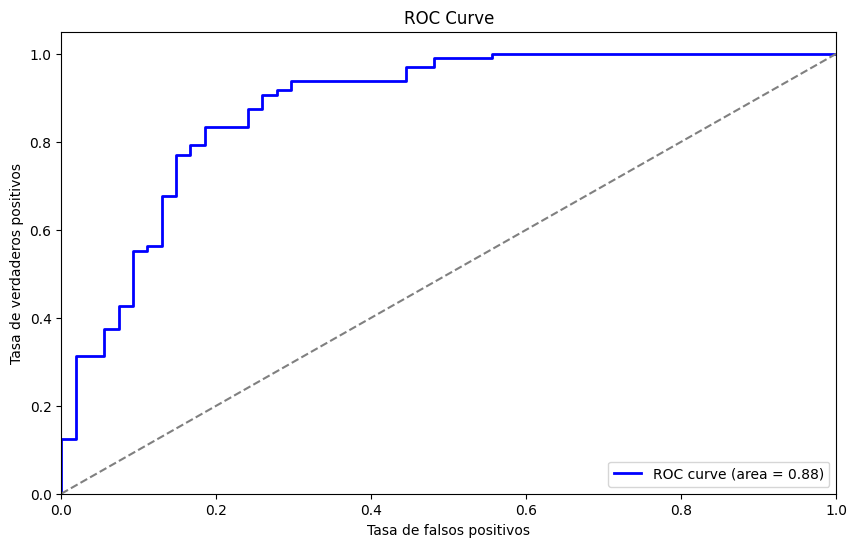

In [370]:
y_pred_proba = best_model.predict_proba(X_test_scaled)[:, 1]

fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de falsos positivos')
plt.ylabel('Tasa de verdaderos positivos')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

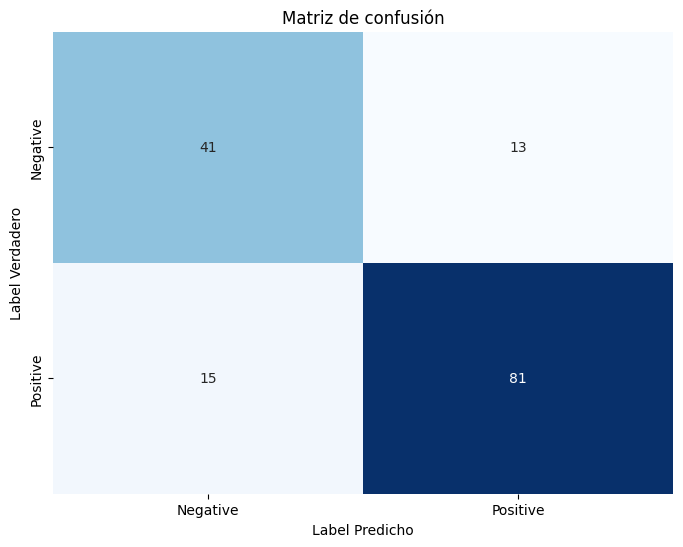

In [372]:
conf_matrix = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Label Predicho')
plt.ylabel('Label Verdadero')
plt.title('Matriz de confusión')
plt.show()